# Exploration of hormonal receptor genes in Polioudakis et al human fetal brain dataset

[Reference paper](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6831089/#SD1) : *We focus on the cortical anlage at mid-gestation (gestation week (GW) 17 to 18) because this period contains the major germinal zones and the developing cortical laminae containing migrating and newly born neurons, and neurodevelopmental processes occurring during this epoch are implicated in neuropsychiatric disease. To optimize detection of distinct cell types, prior to single-cell isolation we separated the cortex into:
the germinal zones (ventricular zone (VZ) and subventricular zone (SVZ)) and developing cortex (subplate (SP) and cortical plate (CP)).*

## 1. Environment Set Up

### 1.1 Library upload

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import igraph as ig
import matplotlib.pyplot as plt 
from scipy.sparse import csr_matrix, isspmatrix
from datetime import datetime
sys.path.append('../')
import functions as fn

print(np.__version__)
print(pd.__version__)
print(sc.__version__)

1.23.5
2.0.0
1.9.3


In [3]:
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=100)

### 1.2 Starting computations: timestamp

In [4]:
print(datetime.now())

2025-07-23 16:07:42.146067


## 2. Read input files

### 2.1 adata loading

GENERAL INFO before filtering:
- Samples: for all donors profiled DNA was acquired from fetal brain tissue (obtained from the UCLA Gene and Cell Therapy Core)
- Sequencing method: Drop-seq (Macosko et al., 2015)
- Obtained number of cells: ~40,000

In [5]:
adata = sc.read('../../../../Polioudakis/3_FiltNormAdata.h5ad')

In [6]:
adata

AnnData object with n_obs × n_vars = 27457 × 17263
    obs: 'Auth_Cluster', 'Auth_Subcluster', 'Auth_Donor', 'Auth_Layer', 'Auth_Gestation_week', 'Auth_Index', 'Auth_Library', 'Auth_Number_genes_detected', 'Auth_Number_UMI', 'Auth_Percentage_mitochondrial', 'Auth_S_phase_score', 'Auth_G2M_phase_score', 'Auth_Phase', 'dataset_id', 'sample_id', 'cell_label', 'brain_region', 'age', 'stage', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'log1p_gene_UMI_ratio', 'n_genes', 'n_counts', 'Leiden_02', 'Leiden_04', 'Leiden_06', 'Leiden_Sel'
    var: 'mito', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'Le

In [7]:
isspmatrix(adata.X)

True

In [8]:
print('Loaded Normalizes AnnData object: number of cells', adata.n_obs)
print('Loaded Normalizes AnnData object: number of genes', adata.n_vars)

# To see the columns of the metadata (information available for each cell)  
print('Available metadata for each cell: ', adata.obs.columns)

Loaded Normalizes AnnData object: number of cells 27457
Loaded Normalizes AnnData object: number of genes 17263
Available metadata for each cell:  Index(['Auth_Cluster', 'Auth_Subcluster', 'Auth_Donor', 'Auth_Layer',
       'Auth_Gestation_week', 'Auth_Index', 'Auth_Library',
       'Auth_Number_genes_detected', 'Auth_Number_UMI',
       'Auth_Percentage_mitochondrial', 'Auth_S_phase_score',
       'Auth_G2M_phase_score', 'Auth_Phase', 'dataset_id', 'sample_id',
       'cell_label', 'brain_region', 'age', 'stage', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito',
       'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo',
       'log1p_gene_UMI_ratio', 'n_genes', 'n_counts', 'Leiden_02', 'Leiden_04',
       'Leiden_06', 'Leiden_Sel'],
      dtype='object')


### 2.2 Receptors signature loading

Loading of hormonal receptor gene signature.

In [9]:
signatures = '../../../../DataDir/ExternalData/Receptors/ReceptorsComplete.txt'

In [10]:
sig = pd.read_csv(signatures, sep="\t", keep_default_na=False)  #keep_default_na=False: remove Na values
print(sig.shape)
sig

(39, 2)


,GeneName,Signature
0,THRB,Thyroid
1,THRA,Thyroid
2,THRAP3,Thyroid
3,DIO1,Thyroid
4,DIO2,Thyroid
5,DIO3,Thyroid
6,SLC16A10,Thyroid
7,SLC16A2,Thyroid
8,SLC7A5,Thyroid
9,KLF9,Thyroid


In [11]:
genes = sig["GeneName"].values.tolist()

## 3. Visualizations

### 3.1 Counts from adata

In [12]:
adata.obsm

AxisArrays with keys: X_diffmap_harmony, X_fa_harmony, X_pca, X_pca_harmony, X_umap_harmony, X_umap_nocorr

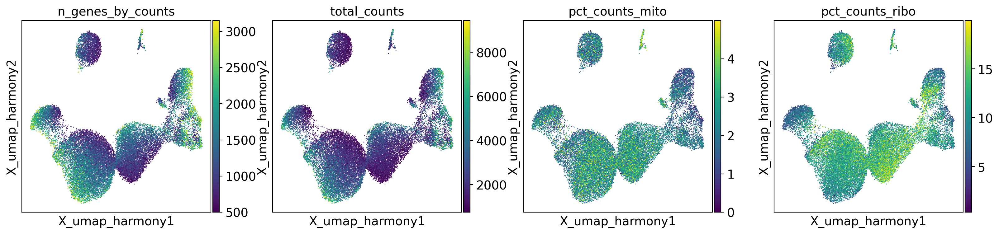

In [13]:
sc.pl.embedding(adata, basis="X_umap_harmony", color=['n_genes_by_counts',"total_counts", 'pct_counts_mito', 'pct_counts_ribo'])

### 3.2 Clusters annotation

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


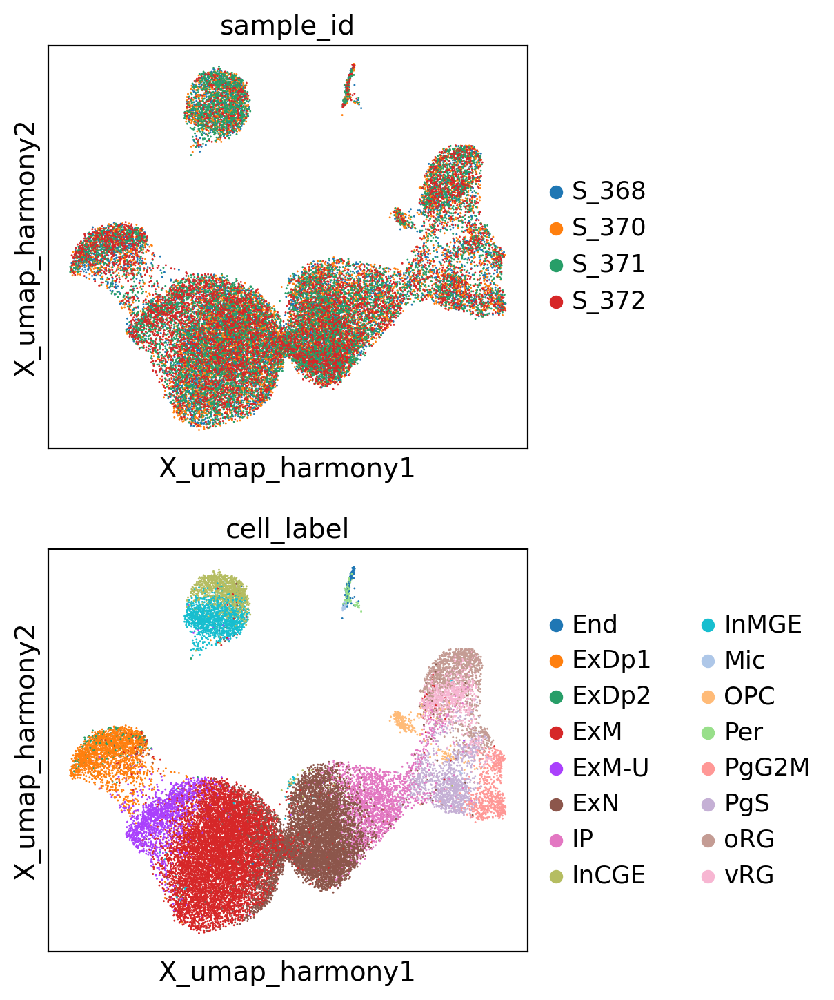

In [14]:
sc.pl.embedding(adata,  basis="X_umap_harmony", color=['sample_id', 'cell_label'], ncols=1)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


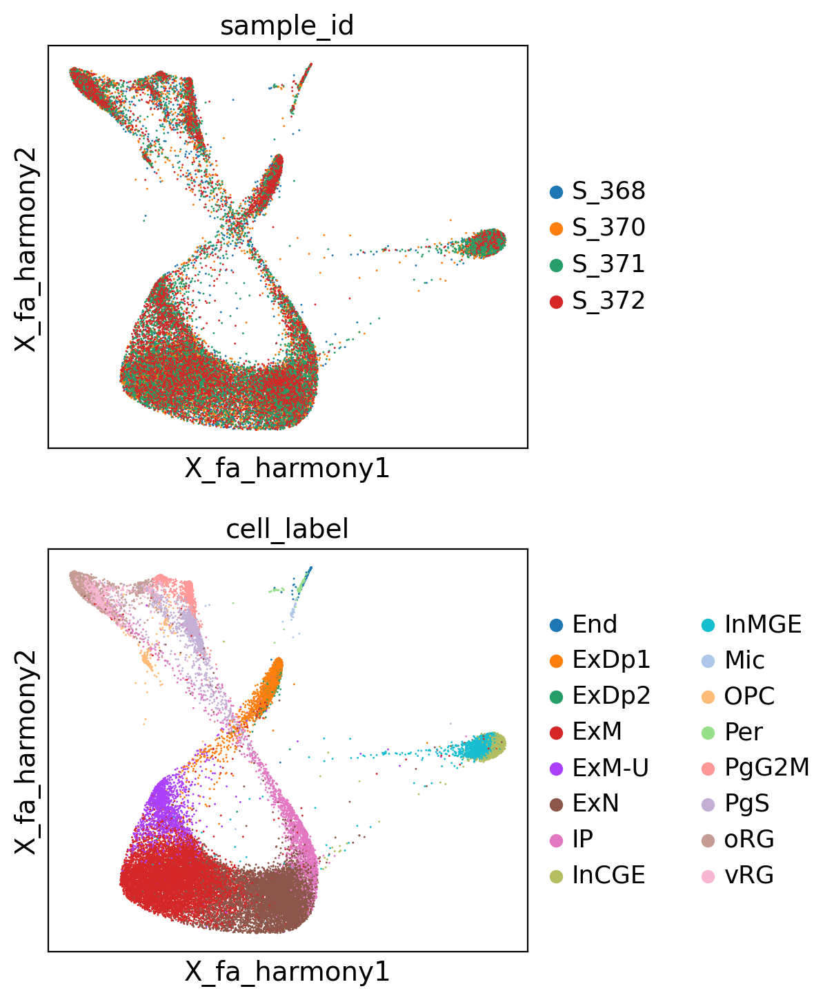

In [15]:
sc.pl.embedding(adata,  basis="X_fa_harmony", color=['sample_id', 'cell_label'], ncols=1)

In [16]:
col1 = {'Off-Target':'#c5b0d5',
        'ExcitatoryNeu':'#aa40fc',
        'Progenitors&RG':'#ff7f0e',
        'InhibitoryNeu':'#17becf'}

In [17]:
sup_dictG  = {'End':'Off-Target',
               'ExDp1': 'ExcitatoryNeu',
               'ExDp2': 'ExcitatoryNeu', 
               'ExM': 'ExcitatoryNeu', 
               'ExM-U': 'ExcitatoryNeu', 
               'ExN': 'ExcitatoryNeu', 
               'IP': 'Progenitors&RG', 
               'InCGE': 'InhibitoryNeu', 
               'InMGE': 'InhibitoryNeu', 
               'Mic': 'Off-Target', 
               'OPC': 'Off-Target', 
               'Per':'Off-Target', 
               'PgG2M':'Progenitors&RG', 
               'PgS':'Progenitors&RG', 
               'oRG':'Progenitors&RG', 
               'vRG':'Progenitors&RG'}

#Crate aggregated annotation
adata.obs['super_cell_label'] = adata.obs['cell_label'].replace(sup_dictG)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


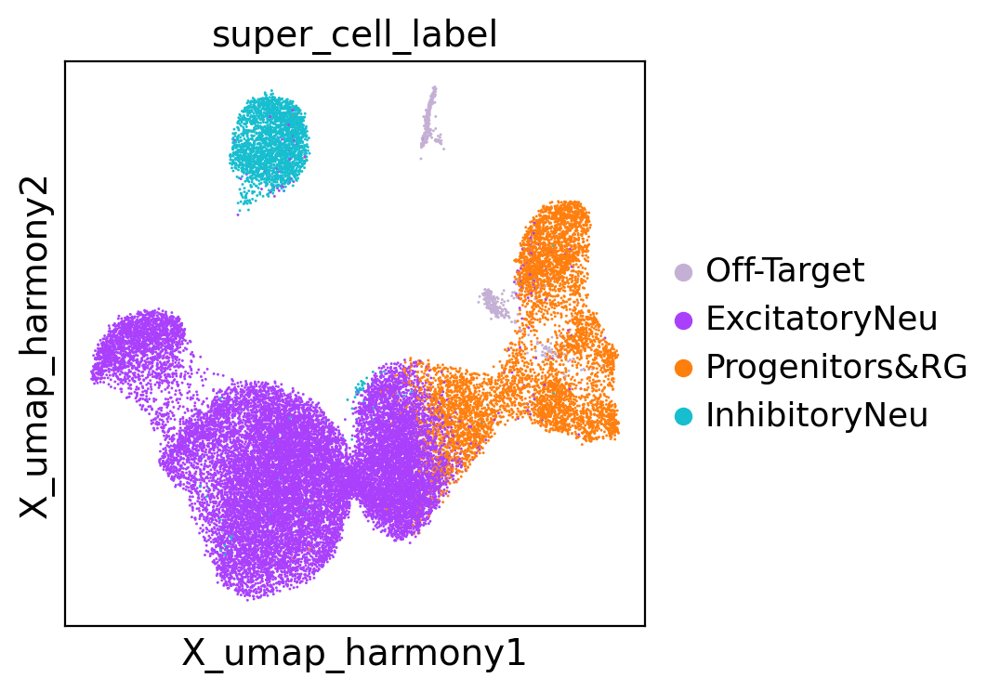

In [18]:
sc.pl.embedding(adata,  basis="X_umap_harmony", color=['super_cell_label'], ncols=1, palette=col1)

### 3.3 Visualization of receptors on UMAP


The following marker genes are missing:  {'AHR', 'PGR', 'ESR1', 'RXRG', 'ESRRB', 'PTGER1', 'AR', 'GPER1', 'DIO3', 'VDR', 'PTGER3', 'PTGER4', 'CYP19A1', 'PTGER2', 'PPARG', 'RARB', 'THRSP', 'DIO1'}


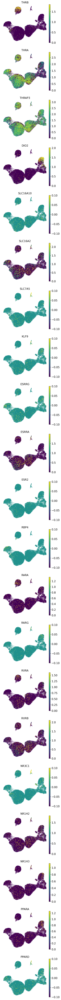

In [19]:
fn.CustomUmap(adata, genes, embedding="X_umap_harmony") 


The following marker genes are missing:  {'AHR', 'PGR', 'ESR1', 'RXRG', 'ESRRB', 'PTGER1', 'AR', 'GPER1', 'DIO3', 'VDR', 'PTGER3', 'PTGER4', 'CYP19A1', 'PTGER2', 'PPARG', 'RARB', 'THRSP', 'DIO1'}


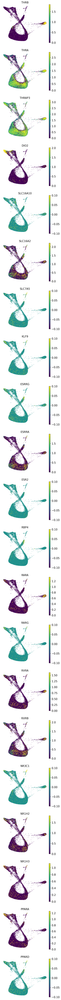

In [20]:
fn.CustomUmap(adata, genes, embedding="X_fa_harmony") 

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


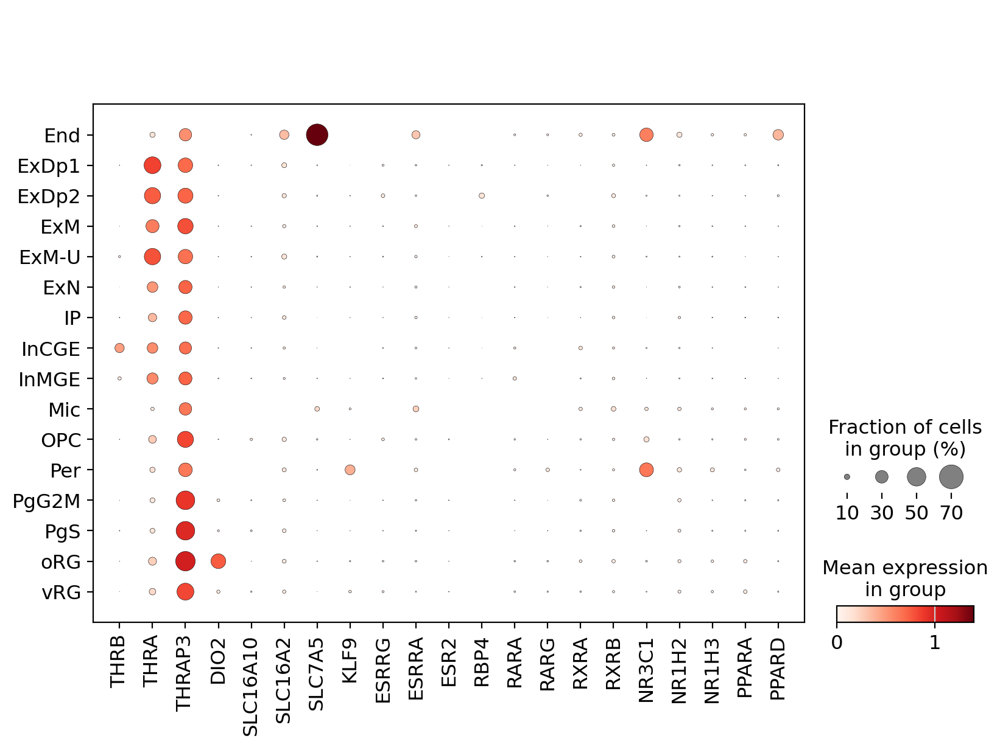

In [25]:
available_genes = [gene for gene in genes if gene in adata.var_names]

if available_genes:
    sc.pl.dotplot(adata, available_genes, groupby='cell_label')
else:
    print("None of the specified genes are found in adata.var_names.")

## 4. Save Notebooks

Adata is not saved, since no new computations have been performed. I just save the notebooks.

### 4.1 Timestamp finished computations

In [26]:
print(datetime.now())

2025-07-23 16:22:14.400917


### 4.2 Save python and html version of notebook

In [28]:
%%bash

# save also html and python versions for git
jupyter nbconvert ExplorationPolioudakis.ipynb --to="python" --output="ExplorationPolioudakis"
jupyter nbconvert ExplorationPolioudakis.ipynb --to="html" --output="ExplorationPolioudakis"

[NbConvertApp] Converting notebook ExplorationPolioudakis.ipynb to python
[NbConvertApp] Writing 4912 bytes to ExplorationPolioudakis.py
[NbConvertApp] Converting notebook ExplorationPolioudakis.ipynb to html
[NbConvertApp] Writing 12888297 bytes to ExplorationPolioudakis.html
